In [65]:
# Dependencies and Setup
import pandas as pd
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, balanced_accuracy_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# File to Load
dropout_data = "dropout.csv"

# Read School and Student Data File and store into Pandas DataFrames
dropout_data_df = pd.read_csv(dropout_data)

dropout_data_df

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4419,1,1,6,15,1,1,1,1,1,6,...,0,6,8,5,12.666667,0,15.5,2.8,-4.06,Graduate
4420,1,1,2,15,1,1,19,1,1,10,...,0,6,6,2,11.000000,0,11.1,0.6,2.02,Dropout
4421,1,1,1,12,1,1,1,22,27,10,...,0,8,9,1,13.500000,0,13.9,-0.3,0.79,Dropout
4422,1,1,1,9,1,1,1,22,27,8,...,0,5,6,5,12.000000,0,9.4,-0.8,-3.12,Graduate


### Separate the features `X` from the target `y`

In [2]:
# Seperate the features, X,  from the target variable, y
y = dropout_data_df['Target']
X = dropout_data_df.drop(columns='Target')

In [3]:
# Preview the features data
X.head()

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0,0.000000,0,10.8,1.4,1.74
1,1,6,1,11,1,1,1,1,3,4,...,0,0,6,6,6,13.666667,0,13.9,-0.3,0.79
2,1,1,5,5,1,1,1,22,27,10,...,0,0,6,0,0,0.000000,0,10.8,1.4,1.74
3,1,8,2,15,1,1,1,23,27,6,...,0,0,6,10,5,12.400000,0,9.4,-0.8,-3.12
4,2,12,1,3,0,1,1,22,28,10,...,0,0,6,6,6,13.000000,0,13.9,-0.3,0.79


In [4]:
# Preview the first five entries for the target variable
y[:5]

0     Dropout
1    Graduate
2     Dropout
3    Graduate
4    Graduate
Name: Target, dtype: object

In [5]:
# Check the balance of our target values
y.value_counts()

Graduate    2209
Dropout     1421
Enrolled     794
Name: Target, dtype: int64

### Separate the data into training and testing subsets.

In [6]:
# Split the dataset using train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

### Scale the data using `StandardScaler`

In [7]:
# Instantiate a StandardScaler instance
scaler = StandardScaler()

# Fit the training data to the standard scaler
X_scaler = scaler.fit(X_train)

# Transform the training data using the scaler
X_train_scaled = X_scaler.transform(X_train)

# Transform the testing data using the scaler
X_test_scaled = X_scaler.transform(X_test)

### Instantiate an K Nearest Neighbor Classifier instance.

In [8]:
# Import the KNeighborsClassifier module from sklearn
from sklearn.neighbors import KNeighborsClassifier

# Instantiate the KNeighborsClassifier model with n_neighbors = 3 
knn = KNeighborsClassifier(n_neighbors=3)

### Fit the model using the training data.

In [9]:
# Train the model using the training data
knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(n_neighbors=3)

### Make predictions using the testing data.

In [10]:
# Create predictions using the testing data
y_pred = knn.predict(X_test_scaled)

### Generate the classification report for the test data.

In [11]:
# Print the classification report comparing the testing data to the model predictions
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

     Dropout       0.71      0.74      0.72       340
    Enrolled       0.43      0.26      0.33       201
    Graduate       0.76      0.84      0.80       565

    accuracy                           0.71      1106
   macro avg       0.63      0.62      0.62      1106
weighted avg       0.68      0.71      0.69      1106



## Create a Logistic Regression Model with the Original Data

In [12]:
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
classifier = LogisticRegression(solver='lbfgs', random_state=1)

# Fit the model using training data
classifier.fit(X_train, y_train)

/Users/r.andrewherr/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=1)

###  Step 1: Fit a logistic regression model by using the training data (`X_train` and `y_train`).

In [13]:
# Make a prediction using the testing data
predictions = classifier.predict(X_test)

pd.DataFrame({"Prediction": predictions, "Actual": y_test}).reset_index(drop=True).head(10)

,Prediction,Actual
0,Dropout,Dropout
1,Graduate,Graduate
2,Graduate,Graduate
3,Graduate,Graduate
4,Dropout,Dropout
5,Dropout,Dropout
6,Graduate,Dropout
7,Dropout,Enrolled
8,Graduate,Graduate
9,Enrolled,Dropout


### Step 3: Evaluate the model’s performance by doing the following:

* Calculate the accuracy score of the model.

* Generate a confusion matrix.

* Print the classification report.

In [14]:
# Print the balanced_accuracy score of the model
acc_score = balanced_accuracy_score(y_test, predictions)

In [15]:
# Generate a confusion matrix for the model
cm = confusion_matrix(y_test, predictions)

cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1", "Actual 2"], columns=["Predicted 0", "Predicted 1", "Predicted 2"])

In [16]:
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

# Print the classification report for the model
# Displaying results
print("")
printmd("**Machine Learning Model 1**")
print("")
print("Confusion Matrix")
display(cm_df)
print(f"Accuracy Score : {acc_score}")
print("Classification Report")
print(classification_report(y_test, predictions))

**Machine Learning Model 1**


Confusion Matrix


,Predicted 0,Predicted 1,Predicted 2
Actual 0,260,39,41
Actual 1,42,66,93
Actual 2,16,20,529


Accuracy Score : 0.6764490923829577
Classification Report
              precision    recall  f1-score   support

     Dropout       0.82      0.76      0.79       340
    Enrolled       0.53      0.33      0.40       201
    Graduate       0.80      0.94      0.86       565

    accuracy                           0.77      1106
   macro avg       0.71      0.68      0.69      1106
weighted avg       0.75      0.77      0.76      1106



## Predict a Logistic Regression Model with Resampled Training Data

### Step 1: Use the `RandomOverSampler` module from the imbalanced-learn library to resample the data. Be sure to confirm that the labels have an equal number of data points. 

In [17]:
# Import the RandomOverSampler module form imbalanced-learn
from imblearn.over_sampling import RandomOverSampler

# Instantiate the random oversampler model
# # Assign a random_state parameter of 1 to the model
oversample = RandomOverSampler(sampling_strategy='auto',  random_state=2)

# Fit the original training data to the random_oversampler model
X_over, y_over = oversample.fit_resample(X_train, y_train)

In [18]:
# Count the distinct values of the resampled labels data
y_over.nunique()

3

### Step 2: Use the `LogisticRegression` classifier and the resampled data to fit the model and make predictions.

In [19]:
# Instantiate the Logistic Regression model
# Assign a random_state parameter of 1 to the model
classifier_2 = LogisticRegression(solver='lbfgs', random_state=1)

# Fit the model using the resampled training data
classifier_2.fit(X_over, y_over)

# Make a prediction using the testing data
predictions_2 = classifier_2.predict(X_test)

pd.DataFrame({"Prediction": predictions_2, "Actual": y_test}).reset_index(drop=True).head(10)

/Users/r.andrewherr/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


,Prediction,Actual
0,Dropout,Dropout
1,Graduate,Graduate
2,Graduate,Graduate
3,Graduate,Graduate
4,Dropout,Dropout
5,Dropout,Dropout
6,Graduate,Dropout
7,Enrolled,Enrolled
8,Graduate,Graduate
9,Enrolled,Dropout


### Step 3: Evaluate the model’s performance by doing the following:

* Calculate the accuracy score of the model.

* Generate a confusion matrix.

* Print the classification report.

In [20]:
# Print the balanced_accuracy score of the model 
acc_score_2 = balanced_accuracy_score(y_test, predictions_2)

In [21]:
# Generate a confusion matrix for the model
cm = confusion_matrix(y_test, predictions_2)

cm_df_2 = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1", "Actual 2"], columns=["Predicted 0", "Predicted 1", "Predicted 2"])

In [22]:
# Print the classification report for the model
print("")
printmd("**Machine Learning Model 2**")
print("")
print("Confusion Matrix")
display(cm_df_2)
print(f"Accuracy Score : {acc_score_2}")
print("Classification Report")
print(classification_report(y_test, predictions_2))

**Machine Learning Model 2**


Confusion Matrix


,Predicted 0,Predicted 1,Predicted 2
Actual 0,246,70,24
Actual 1,28,133,40
Actual 2,16,79,470


Accuracy Score : 0.7390264537109696
Classification Report
              precision    recall  f1-score   support

     Dropout       0.85      0.72      0.78       340
    Enrolled       0.47      0.66      0.55       201
    Graduate       0.88      0.83      0.86       565

    accuracy                           0.77      1106
   macro avg       0.73      0.74      0.73      1106
weighted avg       0.80      0.77      0.78      1106



## Create a Random Forest Model

In [23]:
from sklearn.ensemble import RandomForestClassifier

## Fitting the Random Forest Model

In [24]:
# Create a random forest classifier
rf_model = RandomForestClassifier(n_estimators=500, random_state=78)

In [25]:
# Fitting the model
rf_model = rf_model.fit(X_train_scaled, y_train)

## Making Predictions Using the Random Forest Model

In [26]:
# Making predictions using the testing data
predictions_3 = rf_model.predict(X_test_scaled)

pd.DataFrame({"Prediction": predictions_2, "Actual": y_test}).reset_index(drop=True).head(10)

,Prediction,Actual
0,Dropout,Dropout
1,Graduate,Graduate
2,Graduate,Graduate
3,Graduate,Graduate
4,Dropout,Dropout
5,Dropout,Dropout
6,Graduate,Dropout
7,Enrolled,Enrolled
8,Graduate,Graduate
9,Enrolled,Dropout


## Model Evaluation

In [27]:
# Print the balanced_accuracy score of the model 
acc_score_3 = balanced_accuracy_score(y_test, predictions_3)

In [44]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions_3)
cm_df_3 = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1", "Actual 2"], columns=["Predicted 0", "Predicted 1", "Predicted 2"])

In [45]:
# Displaying results
print("Confusion Matrix")
display(cm_df_3)
print(f"Accuracy Score : {acc_score_3}")
print("Classification Report")
print(classification_report(y_test, predictions))

Confusion Matrix


,Predicted 0,Predicted 1,Predicted 2
Actual 0,106,52,216
Actual 1,61,18,118
Actual 2,145,56,334


Accuracy Score : 0.6812333439517664
Classification Report
              precision    recall  f1-score   support

     Dropout       0.35      0.30      0.32       374
    Enrolled       0.17      0.11      0.13       197
    Graduate       0.50      0.62      0.55       535

    accuracy                           0.42      1106
   macro avg       0.34      0.34      0.34      1106
weighted avg       0.39      0.42      0.40      1106



## Feature Importance

In [30]:
# Random Forests in sklearn will automatically calculate feature importance
importances = rf_model.feature_importances_
# We can sort the features by their importance
sorted(zip(rf_model.feature_importances_, X.columns), reverse=True)

[(0.14722113543188872, 'Curricular units 2nd sem (approved)'),
 (0.10162921779167834, 'Curricular units 2nd sem (grade)'),
 (0.0918940469730886, 'Curricular units 1st sem (approved)'),
 (0.07142995309734973, 'Curricular units 1st sem (grade)'),
 (0.04511293850239968, 'Curricular units 2nd sem (evaluations)'),
 (0.04446537074529606, 'Age at enrollment'),
 (0.043135115547647596, 'Tuition fees up to date'),
 (0.040097210319859036, 'Curricular units 1st sem (evaluations)'),
 (0.03696666237672386, 'Course'),
 (0.03476381095942445, "Father's occupation"),
 (0.03142806585999545, "Mother's occupation"),
 (0.026948180686977834, 'GDP'),
 (0.025918557369823784, 'Unemployment rate'),
 (0.02568302041542502, "Father's qualification"),
 (0.0249153598695873, "Mother's qualification"),
 (0.02484910901929649, 'Application mode'),
 (0.024706318509980247, 'Inflation rate'),
 (0.02223249900190101, 'Curricular units 2nd sem (enrolled)'),
 (0.02071524727145676, 'Curricular units 1st sem (enrolled)'),
 (0.017

<Axes: title={'center': 'Features Importances'}, ylabel='1'>

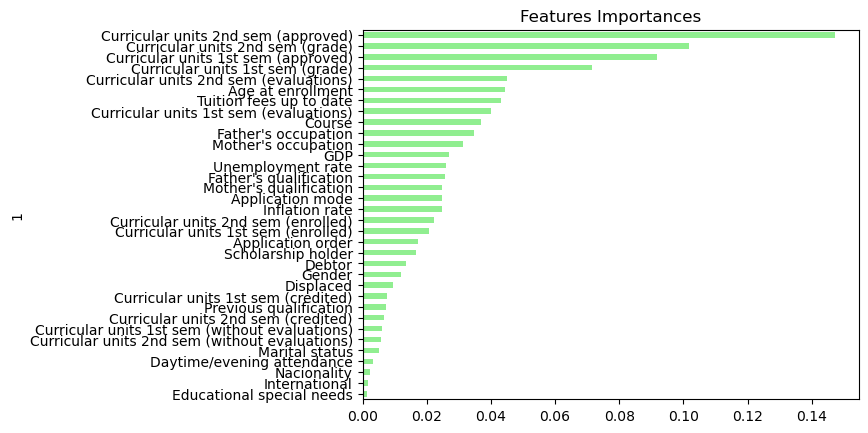

In [31]:
# Visualize the features by importance
importances_df = pd.DataFrame(sorted(zip(rf_model.feature_importances_, X.columns), reverse=True))
importances_df.set_index(importances_df[1], inplace=True)
importances_df.drop(columns=1, inplace=True)
importances_df.rename(columns={0: 'Feature Importances'}, inplace=True)
importances_sorted = importances_df.sort_values(by='Feature Importances')
importances_sorted.plot(kind='barh', color='lightgreen', title= 'Features Importances', legend=False)

## Making Predictions Using a Support Vector Machine

In [32]:
import matplotlib.pyplot as plt
import os

In [33]:
# dropout_data_df["Target"].unique()

In [34]:
# Get the target variables. 
# target = dropout_data_df["Target"]
# target_names = ["Dropout", "Graduate", "Enrolled"]

In [35]:
# Get the features. 
# data = dropout_data_df.drop("Target", axis=1)
# feature_names = data.columns
# data.head()

In [38]:
# Split data into training and testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

In [39]:
# Support vector machine linear classifier
from sklearn.svm import SVC 
model = SVC(kernel='linear')
model.fit(X_train, y_train)

SVC(kernel='linear')

In [40]:
# Model Accuracy
print('Test Acc: %.3f' % model.score(X_test, y_test))

Test Acc: 0.756


In [42]:
# Calculate the classification report
predictions_4 = model.predict(X_test)
print(classification_report(y_test, predictions_4,))

              precision    recall  f1-score   support

     Dropout       0.81      0.76      0.79       374
    Enrolled       0.47      0.29      0.36       197
    Graduate       0.78      0.92      0.84       535

    accuracy                           0.76      1106
   macro avg       0.69      0.66      0.66      1106
weighted avg       0.74      0.76      0.74      1106



In [43]:
# Print the balanced_accuracy score of the model 
acc_score_4 = balanced_accuracy_score(y_test, predictions_4)

In [47]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions_4)
cm_df_4 = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1", "Actual 2"], columns=["Predicted 0", "Predicted 1", "Predicted 2"])

In [48]:
# Displaying results
print("Confusion Matrix")
display(cm_df_4)
print(f"Accuracy Score : {acc_score_4}")
print("Classification Report")
print(classification_report(y_test, predictions_4))

Confusion Matrix


,Predicted 0,Predicted 1,Predicted 2
Actual 0,285,33,56
Actual 1,55,57,85
Actual 2,11,30,494


Accuracy Score : 0.6582455576885494
Classification Report
              precision    recall  f1-score   support

     Dropout       0.81      0.76      0.79       374
    Enrolled       0.47      0.29      0.36       197
    Graduate       0.78      0.92      0.84       535

    accuracy                           0.76      1106
   macro avg       0.69      0.66      0.66      1106
weighted avg       0.74      0.76      0.74      1106



## Decision Tree Model

In [56]:
import pydotplus
from IPython.display import Image
from sklearn import tree
from sklearn.metrics import accuracy_score

In [57]:
# Create the decision tree classifier instance
model = tree.DecisionTreeClassifier()

In [58]:
# Fit the model
model = model.fit(X_train_scaled, y_train)

In [59]:
# Making predictions using the testing data
predictions_5 = model.predict(X_test_scaled)

In [61]:
# Calculating the confusion matrix
cm = confusion_matrix(y_test, predictions)
cm_df_5 = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1", "Actual 2"], columns=["Predicted 0", "Predicted 1", "Predicted 2"])

# Calculating the accuracy score
print('Test Acc: %.3f' % accuracy_score(y_test, predictions))

Test Acc: 0.419


In [62]:
# Print the balanced_accuracy score of the model 
acc_score_5 = balanced_accuracy_score(y_test, predictions_5)

In [63]:
# Displaying results
print("Confusion Matrix")
display(cm_df_5)
print(f"Accuracy Score : {acc_score_5}")
print("Classification Report")
print(classification_report(y_test, predictions_5))

Confusion Matrix


,Predicted 0,Predicted 1,Predicted 2
Actual 0,112,50,212
Actual 1,55,21,121
Actual 2,151,54,330


Accuracy Score : 0.3146315376354752
Classification Report
              precision    recall  f1-score   support

     Dropout       0.33      0.32      0.32       374
    Enrolled       0.15      0.15      0.15       197
    Graduate       0.47      0.48      0.47       535

    accuracy                           0.37      1106
   macro avg       0.31      0.31      0.31      1106
weighted avg       0.36      0.37      0.36      1106



In [64]:
# Create DOT data
dot_data = tree.export_graphviz(
    model, out_file=None, feature_names=X.columns, class_names=["0", "1", "2"], filled=True
)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.534989 to fit

